In [1]:
import torch
from torch import nn
from torchvision import datasets
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import DataLoader
from torch.optim import Adam, SGD
import numpy as np
import matplotlib as mpl
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


from models import NetD, NetG

In [2]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
display(f'Device {device} is available.')

'Device cuda is available.'

In [3]:
dc_gen = NetG().to(device)
dc_dis = NetD().to(device)

batch_size = 128
#lr = 0.0002
lr = 0.0002
epochs = 200
loss_fn = nn.BCELoss()
fixed_noise = torch.randn((64, 100, 1,1), device=device)
fixed_labels = torch.randint(0,10, (64,1)).to(device)
# Other normalization factors are located here:  https://github.com/kuangliu/pytorch-cifar/issues/19
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader = DataLoader(datasets.CIFAR10(root='./hw4data', train=True, transform=transform, download=True), batch_size=batch_size,shuffle=True)
test_loader =  DataLoader(datasets.CIFAR10(root='./hw4data', train=False, transform=transform, download=True), batch_size=batch_size,shuffle=True)

gen_optimizer = Adam(dc_gen.parameters(), lr=lr, betas=(.5, .999))
dis_optimizer = Adam(dc_dis.parameters(), lr=lr, betas=(.5, .999))
#dis_optimizer = SGD(dc_dis.parameters(), lr=lr) 

Files already downloaded and verified
Files already downloaded and verified


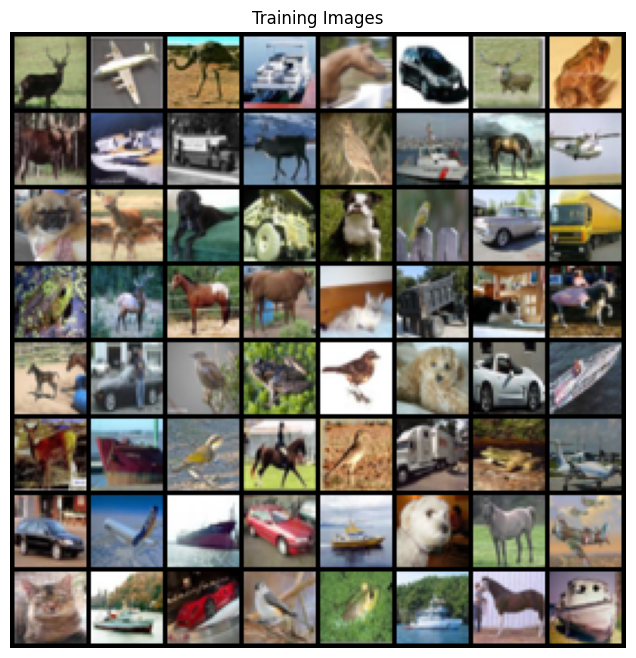

In [4]:
data = next(iter(train_loader))
data[0].shape

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(data[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()


In [5]:

def init_weights(m):
    """Adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. """
    clazz = m.__class__.__name__
    if clazz.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif clazz.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

dc_gen.apply(init_weights)
dc_dis.apply(init_weights)

display(dc_gen)
display(dc_dis)



NetG(
  (embedding): Embedding(10, 100)
  (sequence): Sequential(
    (0): ConvTranspose2d(200, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), pa

NetD(
  (embedding): Embedding(10, 512)
  (sequence): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.5, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.5, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.5, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (last_conv2d): Conv2d(1024, 1, kernel_size=(2, 2), stride=(1, 1), bias=False)
  (flatten): Fl

In [6]:
def train(g, d, gen_optimizer, dis_optimizer, loss_fn, train_loader, epoch):
    derrors, gerrors, gen_imgs, dx, d_g_x1, d_g_x2= [],[], [], [],[], []
    
    for idx, data in enumerate(train_loader):    
        g.train()
        d.train()
        
        d.zero_grad()
        imgs = data[0].to(device)
        batch_size = imgs.size(0)
        label = torch.full((batch_size,), .9, dtype=torch.float, device=device)
        # Real images with discriminator
        output = d(imgs, data[1].to(device))
        d_real_error = loss_fn(output.squeeze(), label)
        d_real_error.backward()      
        dx.append(output.mean().item())

        # Fake images with discriminator
        zvector = torch.randn((batch_size, 100, 1, 1), device=device)
        fakes = g(zvector, data[1].to(device))
        output = d(fakes.detach(), data[1].to(device))
        bad_label = torch.full((batch_size,), 0, dtype=torch.float, device=device)
        d_fake_error = loss_fn(output.squeeze(),bad_label)
        d_fake_error.backward()
        d_g_x1.append(output.mean().item())

        dis_optimizer.step()
        total_Derror = d_fake_error + d_real_error
        #total_Derror.backward()
        derrors.append(total_Derror.item())
        

        # Do the loss of G
        g.zero_grad()
        trick_label = torch.full((batch_size,), .9, dtype=torch.float, device=device)
        #fakes = g(zvector)
        output = d(fakes, data[1].to(device))
        g_error = loss_fn(output.squeeze(), trick_label)
        gerrors.append(g_error.item())
        #print(g_error)
        g_error.backward()
        gen_optimizer.step()
        d_g_x2.append(output.mean().item())

        if idx == (len(train_loader) -1) and (epoch+1) % 20 == 0:
            with torch.no_grad():
                g.eval()
                #torch.randint(0,10, (64,1)).to(device).detach().cpu()
                extra_fake = g(fixed_noise, fixed_labels) #data[1].to(device)).detach().cpu()
                gen_imgs.append(vutils.make_grid(extra_fake, padding=2, normalize=True))
                
                fig = plt.figure(figsize=(8,8))
                plt.axis("off")
                plt.imshow(np.transpose(vutils.make_grid(fakes, padding=2, normalize=True).cpu(), (2,1,0)))
                plt.show()
                plt.close(fig)

    return derrors, gerrors, gen_imgs, dx, d_g_x1, d_g_x2

epoch: 0, D_Loss: 0.8830572115185925, G_Loss: 3.9212360516228637, Dx: 0.6752657388406031, D_G_x1: 0.22685527948119566, D_G_x2: 0.02597181755921963
epoch: 1, D_Loss: 0.7735203693589896, G_Loss: 3.88402157244475, Dx: 0.7101724933632805, D_G_x1: 0.1871767945139838, D_G_x2: 0.020771613761680224
epoch: 2, D_Loss: 0.7639935155353887, G_Loss: 3.6792044121286143, Dx: 0.7175284211745347, D_G_x1: 0.18160660696022993, D_G_x2: 0.0250760839633939
epoch: 3, D_Loss: 0.7647572089644039, G_Loss: 3.6867731099238483, Dx: 0.7215165255014854, D_G_x1: 0.17802735372825199, D_G_x2: 0.027213016743450176
epoch: 4, D_Loss: 0.7878657178500729, G_Loss: 3.498383082392271, Dx: 0.7115308460219741, D_G_x1: 0.18688176434649073, D_G_x2: 0.03381998209765686
epoch: 5, D_Loss: 0.8096624663113938, G_Loss: 3.349373736344945, Dx: 0.7022737771501322, D_G_x1: 0.19690654938445068, D_G_x2: 0.04041361677355569
epoch: 6, D_Loss: 0.8377391589267175, G_Loss: 3.099322966297569, Dx: 0.6908160514386413, D_G_x1: 0.20848689293322129, D_G_

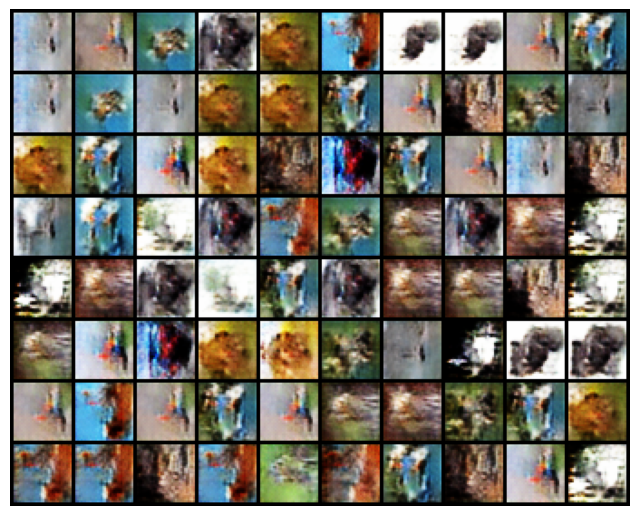

epoch: 19, D_Loss: 0.8228192144952466, G_Loss: 2.9716600380895084, Dx: 0.695801677034639, D_G_x1: 0.20349340478811043, D_G_x2: 0.06038112566202564
epoch: 20, D_Loss: 0.822745980813985, G_Loss: 3.0611036058582, Dx: 0.6982062370957011, D_G_x1: 0.2013260379524144, D_G_x2: 0.05930203041347587
epoch: 21, D_Loss: 0.8175880366274159, G_Loss: 3.0439040151703387, Dx: 0.7003115194151773, D_G_x1: 0.1984613108689256, D_G_x2: 0.060385595226441234
epoch: 22, D_Loss: 0.7939171480095905, G_Loss: 3.1056472230750276, Dx: 0.7085515307953291, D_G_x1: 0.1917829055242631, D_G_x2: 0.05619536093457023
epoch: 23, D_Loss: 0.808913238670515, G_Loss: 2.9407517080721646, Dx: 0.7004805759472006, D_G_x1: 0.1978709340402785, D_G_x2: 0.06590985347959868
epoch: 24, D_Loss: 0.7897076003081963, G_Loss: 3.1745411959450567, Dx: 0.7107455972058084, D_G_x1: 0.18798979609499655, D_G_x2: 0.05476630949641547
epoch: 25, D_Loss: 0.801321473267987, G_Loss: 3.108784623615577, Dx: 0.7080401999261373, D_G_x1: 0.19188360603111784, D_G

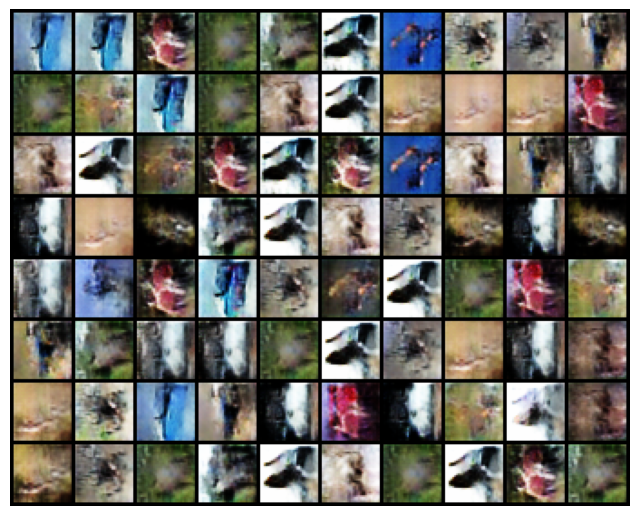

epoch: 39, D_Loss: 0.8129125225269581, G_Loss: 3.0019678540546875, Dx: 0.7069785059870356, D_G_x1: 0.19212229163898037, D_G_x2: 0.06663824385508438
epoch: 40, D_Loss: 0.7668460997016838, G_Loss: 3.103263222652933, Dx: 0.7212955335445721, D_G_x1: 0.17808061156688673, D_G_x2: 0.05811932264967724
epoch: 41, D_Loss: 0.7822140562717262, G_Loss: 3.173717339325439, Dx: 0.7206066943457364, D_G_x1: 0.17934688024778578, D_G_x2: 0.057735513888962565
epoch: 42, D_Loss: 0.7837212660428509, G_Loss: 3.1121714352951635, Dx: 0.7193930304568746, D_G_x1: 0.17943026466042641, D_G_x2: 0.0607016275601421
epoch: 43, D_Loss: 0.7499364148015562, G_Loss: 3.0209456670009875, Dx: 0.7245349002921063, D_G_x1: 0.1750880035076319, D_G_x2: 0.05908876385264661
epoch: 44, D_Loss: 0.7294209245068338, G_Loss: 3.274724820690692, Dx: 0.736980715294933, D_G_x1: 0.16221340080899427, D_G_x2: 0.050985890024405955
epoch: 45, D_Loss: 0.7402463071334088, G_Loss: 3.3030334448875367, Dx: 0.7360851517723649, D_G_x1: 0.163296542646091

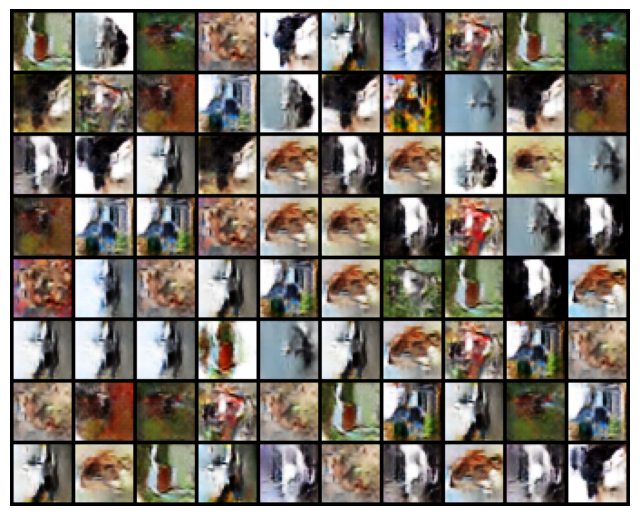

epoch: 59, D_Loss: 0.7843534664424789, G_Loss: 3.191994932301514, Dx: 0.725919224893498, D_G_x1: 0.17437202241176458, D_G_x2: 0.05820974398045884
epoch: 60, D_Loss: 0.7205513106740039, G_Loss: 3.1326409181975343, Dx: 0.7403519213809382, D_G_x1: 0.15902408071891275, D_G_x2: 0.05570949016191313
epoch: 61, D_Loss: 0.6949771657166883, G_Loss: 3.3501406728154253, Dx: 0.7556245409314285, D_G_x1: 0.1440565268169074, D_G_x2: 0.050113418826546345
epoch: 62, D_Loss: 0.7259799396747824, G_Loss: 3.209260944210355, Dx: 0.743512691820369, D_G_x1: 0.15536805089858488, D_G_x2: 0.05592710799013581
epoch: 63, D_Loss: 0.7005652276146442, G_Loss: 3.221028092267263, Dx: 0.7518041109489968, D_G_x1: 0.14775110659239543, D_G_x2: 0.05294070453689698
epoch: 64, D_Loss: 0.7039545173077937, G_Loss: 3.2830121166565838, Dx: 0.751313363537764, D_G_x1: 0.1475190092015135, D_G_x2: 0.05244393863246593
epoch: 65, D_Loss: 0.7130218537719658, G_Loss: 3.275103570555177, Dx: 0.7507891200692453, D_G_x1: 0.14956742254993344, 

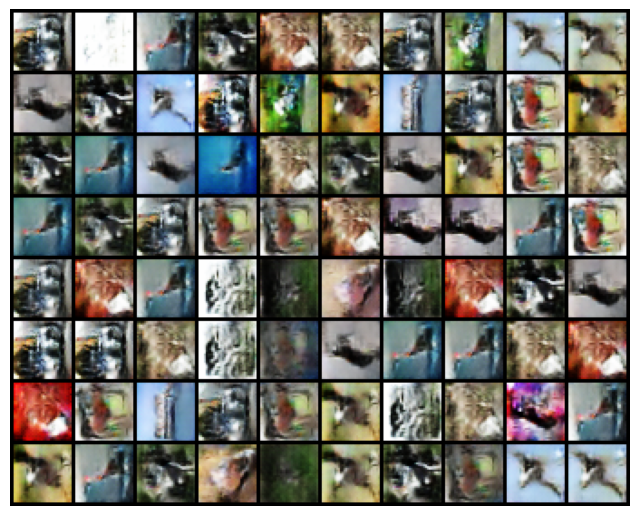

epoch: 79, D_Loss: 0.6568495712774184, G_Loss: 3.475188925138215, Dx: 0.774753300353999, D_G_x1: 0.12534431707235458, D_G_x2: 0.04384625947419697
epoch: 80, D_Loss: 0.6434144675731659, G_Loss: 3.503173847637518, Dx: 0.7759053373275815, D_G_x1: 0.12345856245454696, D_G_x2: 0.04379917974786266
epoch: 81, D_Loss: 0.6308774868088305, G_Loss: 3.59514839387001, Dx: 0.7824573200529493, D_G_x1: 0.11726507806228688, D_G_x2: 0.04007534672203355
epoch: 82, D_Loss: 0.6486098382936414, G_Loss: 3.5794009287339037, Dx: 0.7770415321183022, D_G_x1: 0.12273324887885158, D_G_x2: 0.04140067276636572
epoch: 83, D_Loss: 0.6513225978902538, G_Loss: 3.544815482690816, Dx: 0.7766013165264178, D_G_x1: 0.12279807138221001, D_G_x2: 0.04090480963149301
epoch: 84, D_Loss: 0.5943644382917058, G_Loss: 3.674778335234698, Dx: 0.7986364317367144, D_G_x1: 0.10048805331588602, D_G_x2: 0.0348314584522863
epoch: 85, D_Loss: 0.6128316944669885, G_Loss: 3.805957702419642, Dx: 0.7942238891368631, D_G_x1: 0.10644484966654805, D

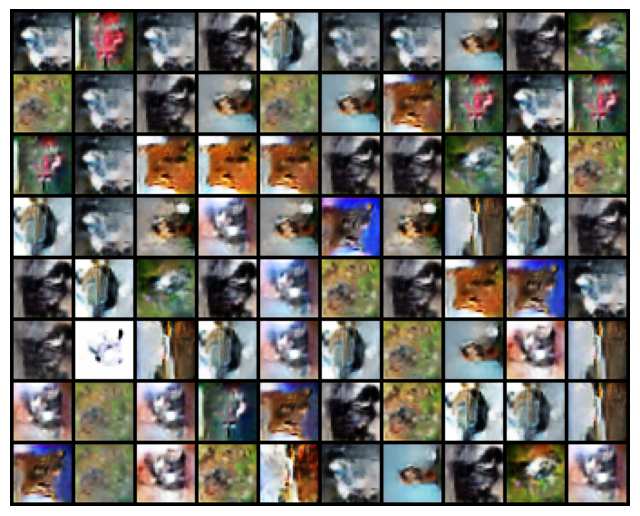

epoch: 99, D_Loss: 0.5616832946420021, G_Loss: 3.855996086469392, Dx: 0.8136638322144824, D_G_x1: 0.08628953775317144, D_G_x2: 0.03157034203948458
epoch: 100, D_Loss: 0.5586024233904641, G_Loss: 3.7564439593678545, Dx: 0.8137139471443108, D_G_x1: 0.08531070384375579, D_G_x2: 0.03333050328785615
epoch: 101, D_Loss: 0.5738435455447878, G_Loss: 3.8216519249064844, Dx: 0.8098341467435403, D_G_x1: 0.08978528602291709, D_G_x2: 0.03315996967517781
epoch: 102, D_Loss: 0.5649705966720191, G_Loss: 3.8107802059949205, Dx: 0.8112980913932976, D_G_x1: 0.08877250617873185, D_G_x2: 0.030588886597144056
epoch: 103, D_Loss: 0.6151652709602395, G_Loss: 3.800250729636463, Dx: 0.7973993409929983, D_G_x1: 0.10317771665899612, D_G_x2: 0.038871594840297674
epoch: 104, D_Loss: 0.6044024856346647, G_Loss: 3.755405867800993, Dx: 0.7997548465838518, D_G_x1: 0.10056727368067807, D_G_x2: 0.03672989840155391
epoch: 105, D_Loss: 0.5870849610594533, G_Loss: 3.7669215440140356, Dx: 0.8042641408608088, D_G_x1: 0.094782

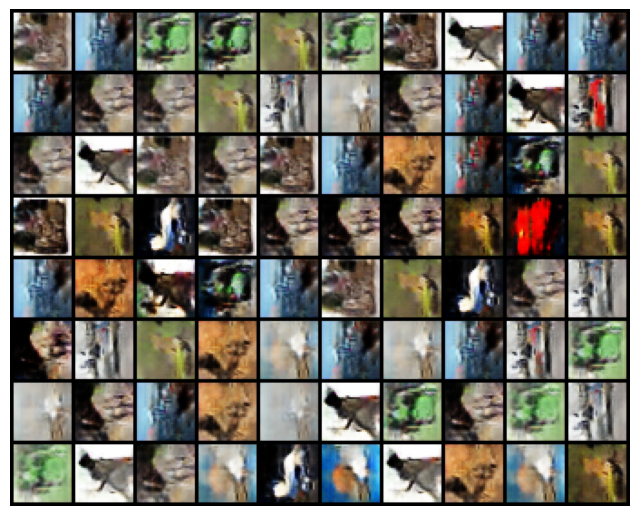

epoch: 119, D_Loss: 0.5356250765835843, G_Loss: 4.146523984954181, Dx: 0.8284187405310628, D_G_x1: 0.07143388561906812, D_G_x2: 0.02525239740654676
epoch: 120, D_Loss: 0.5326556052698199, G_Loss: 4.013989807394764, Dx: 0.828556277943999, D_G_x1: 0.07205280714193145, D_G_x2: 0.027331543677134255
epoch: 121, D_Loss: 0.5459897306264209, G_Loss: 3.948778748207385, Dx: 0.8217928430156025, D_G_x1: 0.07845476255847422, D_G_x2: 0.02830708907206145
epoch: 122, D_Loss: 0.552602188437796, G_Loss: 3.8998628052909052, Dx: 0.8201466242370703, D_G_x1: 0.07928612857165, D_G_x2: 0.02995342873406056
epoch: 123, D_Loss: 0.5473198404397501, G_Loss: 3.911729612313878, Dx: 0.8223914485758222, D_G_x1: 0.07731279576807033, D_G_x2: 0.030023304895800657
epoch: 124, D_Loss: 0.5616395728819815, G_Loss: 3.8437242160367844, Dx: 0.8147801886434141, D_G_x1: 0.08498349113141537, D_G_x2: 0.033104242051864796
epoch: 125, D_Loss: 0.5522886818022374, G_Loss: 3.9504926033946863, Dx: 0.8203215075423346, D_G_x1: 0.0793317676

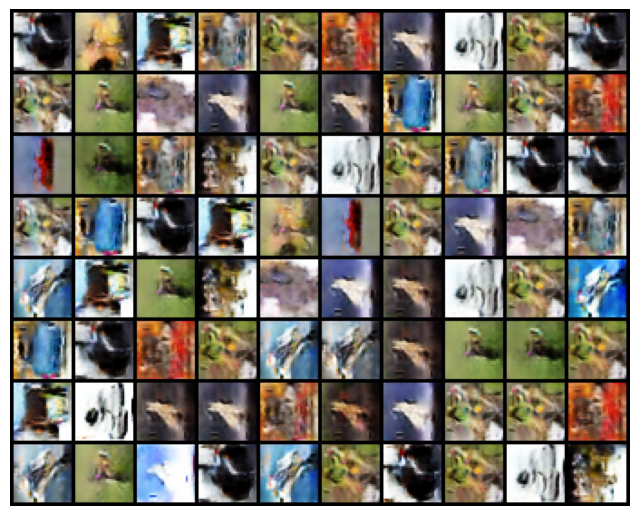

epoch: 139, D_Loss: 0.5382047721644496, G_Loss: 3.885047457712081, Dx: 0.827480176373211, D_G_x1: 0.071787776906029, D_G_x2: 0.03017345069342798
epoch: 140, D_Loss: 0.5274213154602538, G_Loss: 3.9984989782123614, Dx: 0.8322769680139049, D_G_x1: 0.06821937505822734, D_G_x2: 0.02666222563706716
epoch: 141, D_Loss: 0.5188233632870647, G_Loss: 3.960566165806997, Dx: 0.8335183522737849, D_G_x1: 0.06597986678342613, D_G_x2: 0.02628701150230051
epoch: 142, D_Loss: 0.5402958076780714, G_Loss: 4.0478807645075765, Dx: 0.8279249183357219, D_G_x1: 0.07281974756993743, D_G_x2: 0.027090181940017253
epoch: 143, D_Loss: 0.5278833814899025, G_Loss: 4.032991606256236, Dx: 0.8342274746016773, D_G_x1: 0.06597435360083201, D_G_x2: 0.02697188819204728
epoch: 144, D_Loss: 0.5004980456646141, G_Loss: 3.9794084111138073, Dx: 0.8407474958225895, D_G_x1: 0.058824300735622, D_G_x2: 0.02468493289869193
epoch: 145, D_Loss: 0.5168149037586759, G_Loss: 4.07252616742078, Dx: 0.834158886424111, D_G_x1: 0.06450619323082

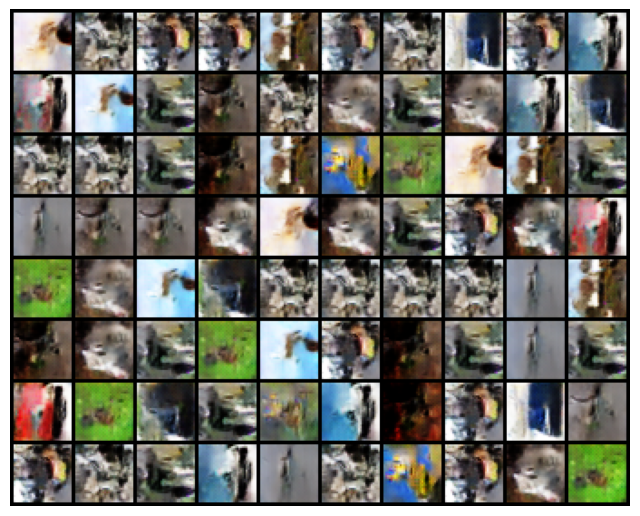

epoch: 159, D_Loss: 0.511790243789668, G_Loss: 3.9899647345628275, Dx: 0.8384195627916194, D_G_x1: 0.0623952277448943, D_G_x2: 0.024794564589553172
epoch: 160, D_Loss: 0.5069970904713701, G_Loss: 4.135278049942173, Dx: 0.8421607971038965, D_G_x1: 0.05698292577997102, D_G_x2: 0.022952716949361893
epoch: 161, D_Loss: 0.5059329723305714, G_Loss: 4.007775236578548, Dx: 0.8399550180758357, D_G_x1: 0.061492979606908874, D_G_x2: 0.025232880964608448
epoch: 162, D_Loss: 0.5114285403962635, G_Loss: 4.107128978995106, Dx: 0.8384718202873874, D_G_x1: 0.06007484615395736, D_G_x2: 0.024558224358603054
epoch: 163, D_Loss: 0.49997613001662444, G_Loss: 4.0289879924501, Dx: 0.8427063749574334, D_G_x1: 0.05772232127797497, D_G_x2: 0.02439342866435259
epoch: 164, D_Loss: 0.49674780030384696, G_Loss: 3.999184407541514, Dx: 0.8410558726476587, D_G_x1: 0.05874889775428235, D_G_x2: 0.023743097450199497
epoch: 165, D_Loss: 0.5077809168554633, G_Loss: 4.15725273427451, Dx: 0.840350467949877, D_G_x1: 0.05942887

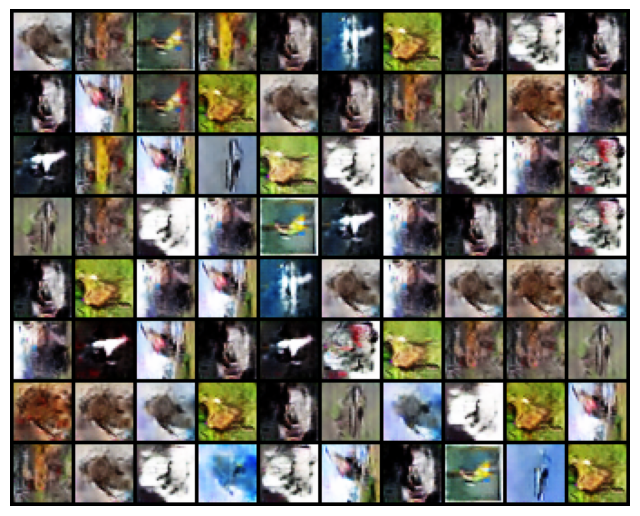

epoch: 179, D_Loss: 0.5060048610962871, G_Loss: 4.050411524065315, Dx: 0.8414678674219819, D_G_x1: 0.058827258116515624, D_G_x2: 0.025865500119769777
epoch: 180, D_Loss: 0.49608983347178115, G_Loss: 4.054909071349122, Dx: 0.8425324986048062, D_G_x1: 0.05770730849145852, D_G_x2: 0.02366731182018252
epoch: 181, D_Loss: 0.48506112179487865, G_Loss: 4.26885349854179, Dx: 0.8513784079295595, D_G_x1: 0.04869378199922921, D_G_x2: 0.02035462666745655
epoch: 182, D_Loss: 0.5025838823117259, G_Loss: 4.166990414909694, Dx: 0.8424451946450011, D_G_x1: 0.05643181540631711, D_G_x2: 0.02424763301831058
epoch: 183, D_Loss: 0.4845030486888593, G_Loss: 4.092318885466632, Dx: 0.849412226387302, D_G_x1: 0.05046365621125759, D_G_x2: 0.021974704104185085
epoch: 184, D_Loss: 0.4825533995085665, G_Loss: 4.1831183198772734, Dx: 0.8524404942532025, D_G_x1: 0.047559248222171537, D_G_x2: 0.02031782079134327
epoch: 185, D_Loss: 0.4701650862955986, G_Loss: 4.291709809656948, Dx: 0.857630177074686, D_G_x1: 0.0428428

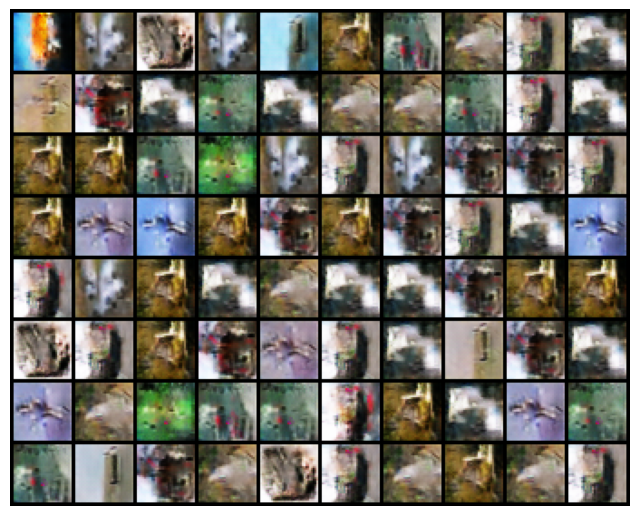

epoch: 199, D_Loss: 0.4552411980488721, G_Loss: 4.269862058217568, Dx: 0.8620297068830036, D_G_x1: 0.03825282922897088, D_G_x2: 0.017922878174794255


In [7]:
# Training Loop
alld, allg, all_imgs = [],[],[]
for epoch in range(epochs):
    d_real_error, g_error, gen_imgs, dx, d_g_x1, d_g_x2 = train(dc_gen, dc_dis, gen_optimizer, dis_optimizer, loss_fn, train_loader, epoch)
    print(f'epoch: {epoch}, D_Loss: {sum(d_real_error)/len(d_real_error)}, G_Loss: {sum(g_error)/len(g_error)}, Dx: {sum(dx)/len(dx)}, D_G_x1: {sum(d_g_x1)/len(d_g_x1)}, D_G_x2: {sum(d_g_x2)/len(d_g_x2)}')
    alld.extend(d_real_error)
    allg.extend(g_error)
    all_imgs.extend(gen_imgs)


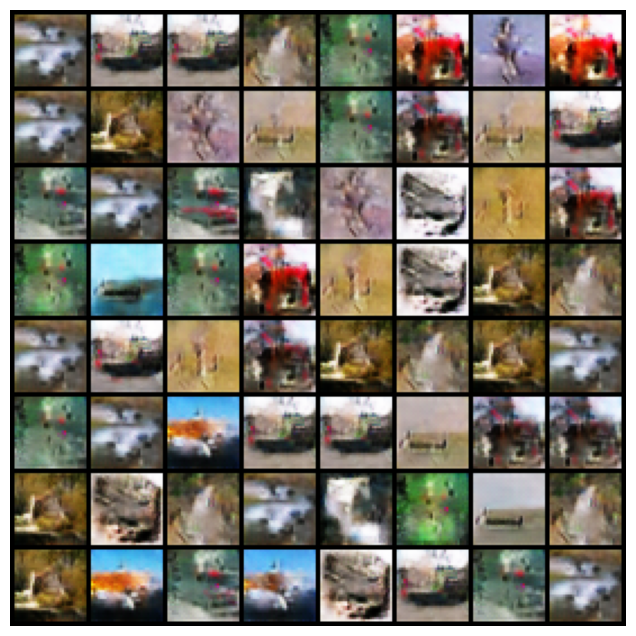

In [8]:
mpl.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(8,8))
plt.axis("off")
image = [[plt.imshow(np.transpose(i.cpu()[:3], (1,2,0)), animated=True)] for i in all_imgs]
#image = [[plt.imshow(i.cpu(), animated=True)] for i in all_imgs]
ani = animation.ArtistAnimation(fig, image, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [9]:
len(allg)

78200

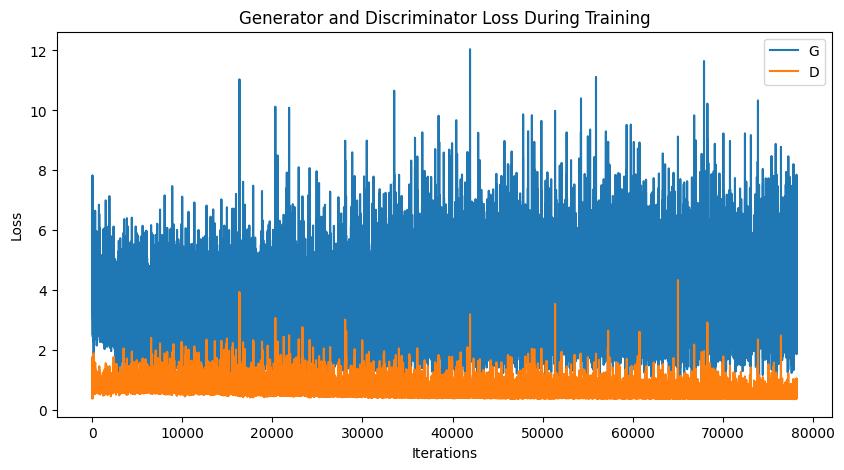

In [10]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(allg,label="G")
plt.plot(alld,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [11]:
torch.save(dc_gen.state_dict(),'generate.pth')
torch.save(dc_dis.state_dict(), 'discriminator.pth')

# dc_gen, dc_dis

torch.Size([1, 100, 1, 1])

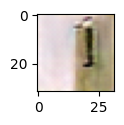

In [12]:
dc_gen.eval()
rando_noise = torch.randn(1,100,1,1)
img = dc_gen(rando_noise.to(device), data[1][0].to(device))
fig = plt.figure(figsize=(1,1))
plt.imshow(np.transpose(vutils.make_grid(img, padding=2, normalize=True).cpu(), (2,1,0)))
#img.cpu().detach()
#np.transpose(img.detach().cpu(), (1,2,0))
#fixed_noise[0,:].unsqueeze(0).shape
torch.full((1,100,1,1), .75 ).shape

In [13]:
gen_imgs[0].shape

torch.Size([3, 274, 274])